# Generate topgraphic maps

### Content

+ [1. Notebook description](#1.-Notebook-Description)
+ [2. Generation](#2.-Generation)
    + [2.1 individual subjects](#2.1-individual-subjects)
    + [2.2 pooled subjects](#2.2-pooled-subjects)


---

# 1. Notebook Description


Using the `mne.viz` package I am reading in previously stored **filters** (classifier weights).

Example **patterns** $A$ are generated using previously transformed input data $X$ and the weight matrix $W$:

$$
A = (X \cdot X^{T}) \cdot W
$$

---

**Imports:**

In [1]:
from digits.data import select

from mne import create_info, EvokedArray
from mne.viz import plot_topomap, plot_layout, plot_montage
from mne.channels import make_eeg_layout

from os import path

%matplotlib inline

In [2]:
subjects = [3130, 3131, 3132, 3134, 3135, 3136, 3138, 3146, 3147, 3149,
            3154, 3156, 3157, 3158, 3159, 3161, 3162, 3233, 3237, 3239,
            3240, 3241, 3242, 3243, 3245, 3248, 3250, 3251, 3252, 3253,
            3255, 3260]

subjects_ordered = [3132, 3130, 3240, 3233, 3156, 3253, 3237, 3136, 3245,
                    3138, 3146, 3157, 3255, 3161, 3149, 3158, 3162, 3147,
                    3250, 3251, 3135, 3252, 3131, 3243, 3241, 3159, 3248,
                    3239, 3154, 3134, 3260, 3242]

dataroot = '../../data/thomas/artcorr/'

---
# 2. Generation

---

## 2.1 individual subjects

Use pre-computed data for the `short_nofft20` transformation and load weights from the corresponding `lda_t` data.
Then, for the best 10 subjects, plot filters and patterns for a 0-sample and a 1-sample.

3132


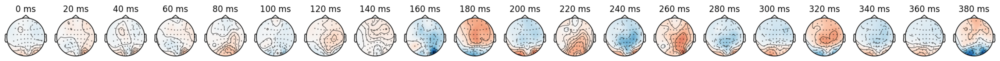

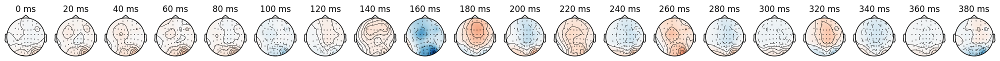

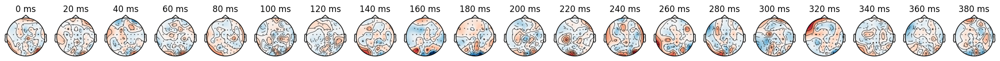

3130


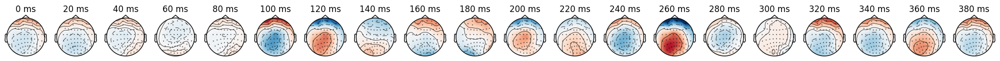

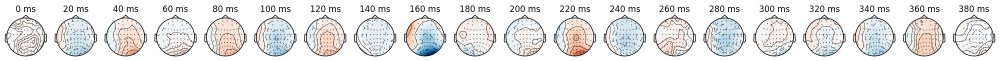

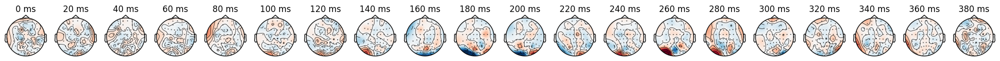

3240


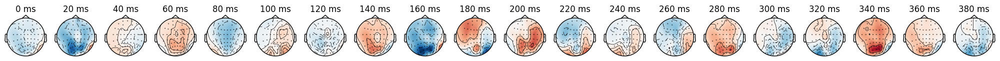

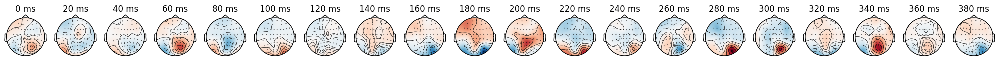

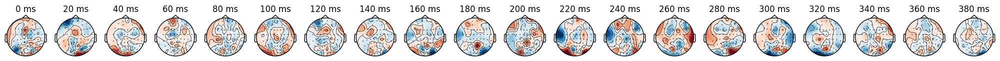

3233


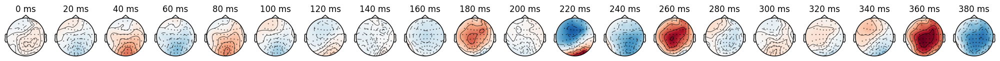

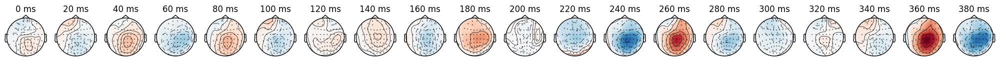

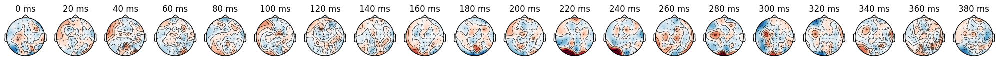

3156


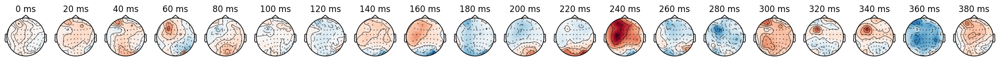

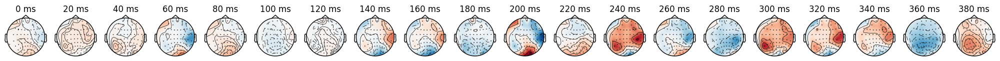

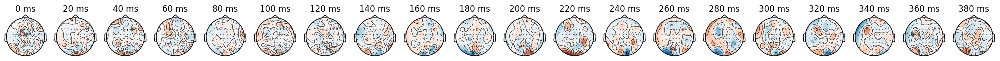

3253


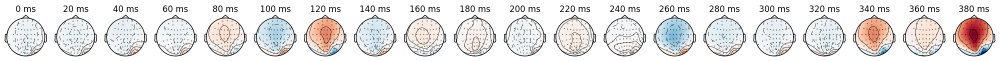

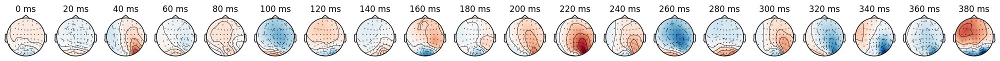

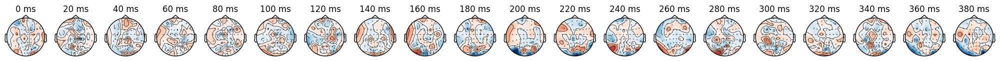

3237


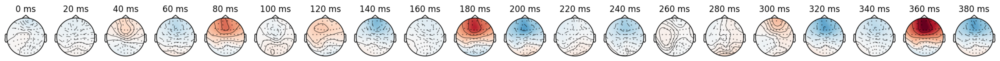

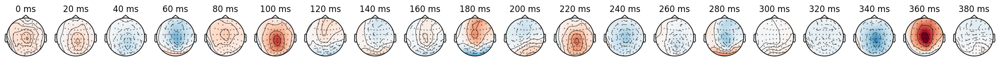

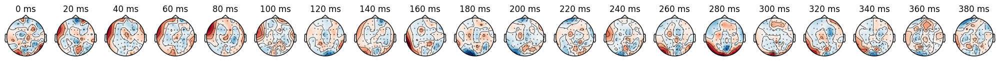

3136


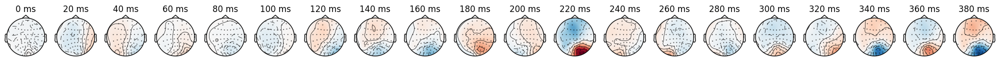

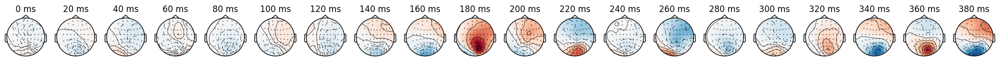

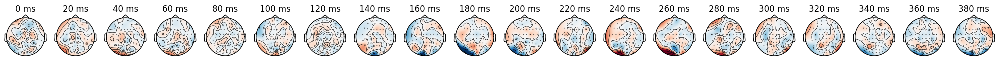

3245


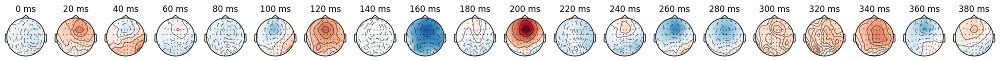

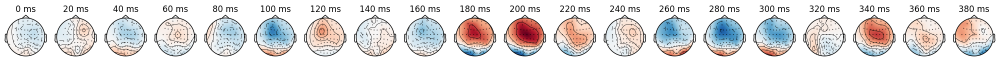

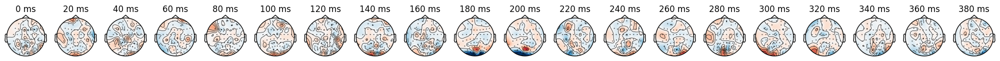

3138


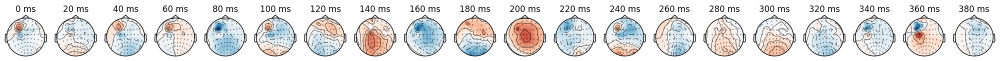

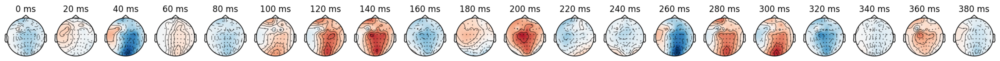

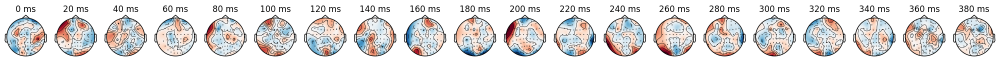

In [3]:
for subject in subjects_ordered[0:10]:
    subject = str(subject)
    print(subject)
    config_file = 'short_nofft20.yaml'
    group = 'lda_t'

    infile = subject+'_'+config_file+'.h5'
    weightsfile = 'weights_'+group+'_'+subject+'.h5'

    store = pd.HDFStore(path.join(dataroot, 'transformed', infile))
    samples = store['samples'].copy()
    targets = store['targets'].copy()
    store.close()

    store = pd.HDFStore(weightsfile)
    weights = store['weights'].copy()
    store.close()
    
    f_s = 50
    info = create_info(select.getchannelnames(samples),
                   sfreq=f_s,
                   ch_types='eeg',
                   montage='standard_1005')
    layout = make_eeg_layout(info)

    w0 = weights[group][0][1].reshape(61,-1)
    s0, t0 = select.fromtargetlist(samples, targets, [0,1])
    s1, t1 = select.fromtargetlist(s0, t0, [1,2])
    s0, t0 = select.fromtargetlist(s0, t0, [0,2])

    d0 = s0.iloc[0].reshape(61,-1)
    d1 = s1.iloc[0].reshape(61,-1)
    pat0 = np.dot(np.dot(d0,d0.T), w0)
    pat1 = np.dot(np.dot(d1,d1.T), w0)
    #pat0 = np.pat0.mean(axis=1),1)

    arr = EvokedArray(pat0, info, tmin=0)
    im1 = arr.plot_topomap(times=1/f_s * np.arange(0,pat0.shape[1]), size=1, colorbar=False)

    arr = EvokedArray(pat1, info, tmin=0)
    im2 = arr.plot_topomap(times=1/f_s * np.arange(0,pat1.shape[1]), size=1, colorbar=False)

    arr = EvokedArray(w0, info, tmin=0)
    im3 = arr.plot_topomap(times=1/f_s * np.arange(0,w0.shape[1]), size=1, colorbar=False)
    
    im1.savefig('pattern_'+subject+'_0.pdf')
    im2.savefig('pattern_'+subject+'_1.pdf')
    im3.savefig('filters_'+subject+'_01.pdf')

## 2.2 pooled subjects

First, we create a layout for `mne`.

In [4]:
basepath = '../../data/thomas/artcorr/imported'

dataset = 'short_lda_4.yaml.h5'
dataset = 'short_lda_1.yaml.h5'

info = create_info(select.getchannelnames(samples),
                   sfreq=1,
                   ch_types='eeg',
                   montage='standard_1005')
layout = make_eeg_layout(info)

Then we have to load the pooled data to estimate a covariance matrix $XX^{T}$

In [5]:
store = pd.HDFStore(path.join(basepath, dataset))
samples = store['samples']
targets = store['targets']
store.close()

store = pd.HDFStore('../analysis/results_pooled_short_lda_1.h5')
weights = store['weights']
store.close()

Extract and reshape the filter matrix, as it is stored as a single vector.
The `select.fromtargetlist` expects a list of at least two target labels, so we use a two-step selection to really filter out data that belongs to only a single class (once for $0$ and once for $1$, just as an example).

In [6]:
w0 = weights['lda'][0][1].reshape(61,-1)
s0, t0 = select.fromtargetlist(samples, targets, [0,1])
s1, t1 = select.fromtargetlist(s0, t0, [1,2])
s0, t0 = select.fromtargetlist(s0, t0, [0,2])

We simply take the first sample from the data and estimate the covariance matrix using the dot product.
We left-multiply this then with the weights from above to generate an example pattern for each of the two classes.

In [7]:
d0 = s0.iloc[0].reshape(61,-1)
d1 = s1.iloc[0].reshape(61,-1)
pat0 = np.dot(np.dot(d0,d0.T), w0)
pat1 = np.dot(np.dot(d1,d1.T), w0)

Now we can plot and save the topographic maps using the prepared data.

### patterns for a 0-sample

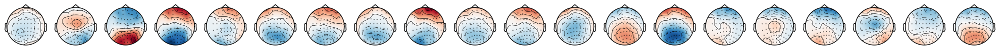

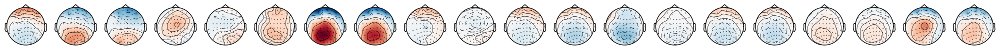

In [8]:
arr = EvokedArray(pat0, info, tmin=0)
im1 = arr.plot_topomap(times=np.arange(0,20), size=1, colorbar=False, time_format='')
im2 = arr.plot_topomap(times=np.arange(20,40), size=1, colorbar=False, time_format='')
im1.savefig('pooled_pattern_0a.pdf')
im2.savefig('pooled_pattern_0b.pdf')

### patterns for a 1-sample

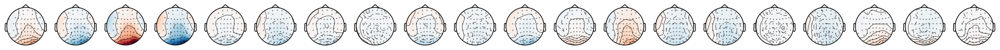

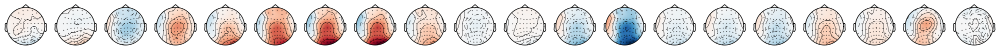

In [9]:
arr = EvokedArray(pat1, info, tmin=0)
im1 = arr.plot_topomap(times=np.arange(0,20), size=1, colorbar=False, time_format='')
im2 = arr.plot_topomap(times=np.arange(20,40), size=1, colorbar=False, time_format='')
im1.savefig('pooled_pattern_1a.pdf')
im2.savefig('pooled_pattern_1b.pdf')

### filters

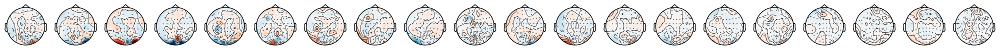

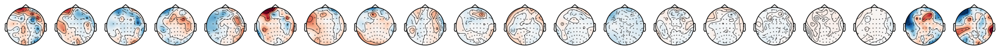

In [10]:
arr = EvokedArray(w0, info, tmin=0)
im1 = arr.plot_topomap(times=np.arange(0,20),  size=1, colorbar=False, time_format='')
im2 = arr.plot_topomap(times=np.arange(20,40), size=1, colorbar=False, time_format='')
im1.savefig('pooled_filters_01a.pdf')
im2.savefig('pooled_filters_01b.pdf')

### list frequency names

`plot_topomap()` expects the data to be time series, so we cannot easily add custom labels above the individual maps.

In [20]:
fs = [f.split('_')[1].split('.')[0] for f in samples.columns.levels[1]]

print(np.unique([int(f) for f in fs])[:10])
print(np.unique([int(f) for f in fs])[10:])
print(np.unique([int(f) for f in fs]))

[ 2  4  6  8 10 12 14 18 22 28]
[ 32  40  50  60  74  90 110 134 164 200]
[  2   4   6   8  10  12  14  18  22  28  32  40  50  60  74  90 110 134
 164 200]


---